In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pylab as plt
import matplotlib.colors as colors
import matplotlib.patches as patches
import torchvision
import matplotlib.patches as patches
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.gridspec as gridspec

import os
import time
import torch
import sys
import argparse
sys.path.insert(0, '../../shared_code')
from model_loader_func import * 
from dataloader_func import *
from quality_metrics_func import *
from linear_approx import *
from inverse_tasks_func import synthesis
from plotting_func import *
from algorithm_inv_prob import * 
from trainer import make_loader
%matplotlib inline

In [2]:
print(torch.__version__)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device

2.5.0+cu124


device(type='cuda')

# Load denoisers 

In [4]:
denoisers = {}

root_path = '/mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/denoisers/'

paths = { 
            # 'mixture-color': 'UNet_flex/imagenet/0to300_RF_84x84_set_size_1232457_color_64x64/',
         # 'mixture-color-large-no-skip':'UNet_flex/imagenet/0to300_RF_232x232_set_size_1232457_color_no_skips_64x64/',       
         # 'mixture-color-large':'UNet_flex/imagenet/0to300_RF_232x232_set_size_1232457_color_64x64/',                  
         'mixture-color-deep-no-skip':'UNet_flex/imagenet/0to255_RF_84x84_set_size_1232457_color_no_skip_deep_dec_64x64/',
         
         # 'mixture-modified-color': 'UNet_flex/imagenet/0to300_RF_84x84_set_size_1232457_color_64x64/',
         # 'mixture-modified-color-large-no-skip':'UNet_flex/imagenet/0to300_RF_232x232_set_size_1232457_color_no_skips_64x64/',
         # 'mixture-modified-color-large':'UNet_flex/imagenet/0to300_RF_232x232_set_size_1232457_color_64x64/',
         
         # 'mixture-modified-color-deep-no-skip':'UNet_flex/imagenet/0to255_RF_84x84_set_size_1232457_color_no_skip_deep_dec_64x64/',
    
        }

groups = paths.keys()


for group in groups: 
    path = root_path + paths[group]
    
    print('loading group ' , group )
    if 'modified' in group.split('-'):
        new_arch = 'UNet_conditional_mean_matching'
    else: 
        new_arch = None
    denoisers[group] = load_learned_model(path, print_args=True, new_arch=new_arch)
    start_time_total = time.time()        
    print("--- %s seconds ---" % (round(time.time() - start_time_total)))
     

loading group  mixture-color-deep-no-skip
*************** saved arguments:*************
arch_name UNet_flex
lr 0.001
batch_size 1024
num_epochs 1500
lr_freq 100
loss_weight False
noise_level_range [0, 255]
quadratic_noise True
rescale False
swap False
set_size 1232457
imagenet_subset_ids None
data_name imagenet
data_root_path /mnt/home/zkadkhodaie/ceph/datasets/
dir_name /mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/denoisers/UNet_flex/imagenet/0to255_RF_84x84_set_size_1232457_color_no_skip_deep_dec_64x64
optional_dir_label color_no_skip_deep_dec
device cuda
debug False
kernel_size 3
padding 1
skip False
num_channels 3
bias True
RF 84
coarse True
self_cond False
num_kernels [64, 128, 256, 512]
num_blocks 3
num_enc_conv [2, 2, 2]
num_mid_conv 3
num_dec_conv [6, 6, 6]
NormType LayerNorm
inter_skip True
dilations None
data_path /mnt/home/zkadkhodaie/ceph/datasets/imagenet
******************************************************
number of parameters is  13125187
train mode: Fa

# Sensitivity to simple stimuli 

In [5]:

def make_sine_wave(im_shape, k, theta_deg, shift=0, color=None):
    """
    Generate a batch of oriented sine wave images with random phase shifts.

    Parameters:
    - im_shape: tuple (H, W) size of each image
    - k: frequency (cycles per image)
    - theta_deg: orientation angle in degrees (0 = horizontal, 90 = vertical
    - color: if None, grayscale. 
    
    Returns:
    - image: array of shape (1,3, H, W) with values in [0, 1]
    """
    H, W = im_shape
    theta = np.radians(theta_deg)

    # Create coordinate grid
    x = np.linspace(-0.5, 0.5, W)
    y = np.linspace(-0.5, 0.5, H)
    X, Y = np.meshgrid(x, y)

    # Project coordinates onto orientation direction
    coord_proj = X * np.cos(theta) + Y * np.sin(theta)

    # Generate sine waves with random phase shifts
    # if shift is None:
        # shift = np.random.uniform(0, 2*np.pi)  # random phase

        
    if color is None:
        # color = np.random.rand(3)  # random RGB values in [0, 1]
        color = [1,1,1]
    
    image = np.cos(2 * np.pi * k * coord_proj + shift)
    image = 0.5 * image + 0.5  # normalize to [0, 1]

    colored_image = np.stack([image * c for c in color], axis=0)  # (3, H, W)
    image_tensor = torch.tensor(colored_image, dtype=torch.float32).unsqueeze(0)  # (1, 3, H, W)

    return image_tensor
        

##  Frequency sensitivity 


In [9]:
sin_ims = {}
frequencies = np.logspace(0, 1.5, 16 )
orientations = np.linspace(0, 180, 16)
for theta_deg in orientations: 
    sin_ims[theta_deg] = []
    for k in frequencies :     
        sin_ims[theta_deg].append(make_sine_wave(im_shape = (64,64), k=k, theta_deg= theta_deg, shift=0, color=None))
    sin_ims[theta_deg] = torch.cat(sin_ims[theta_deg])    


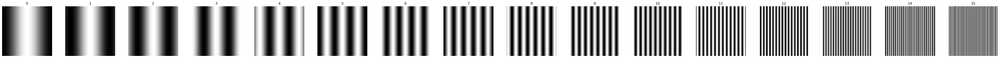

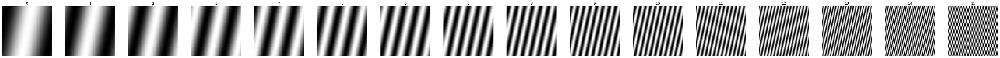

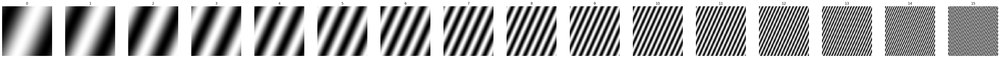

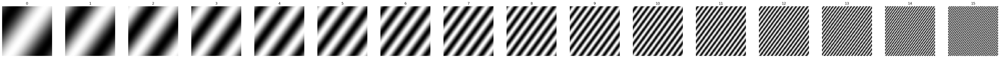

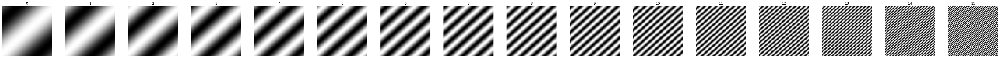

...

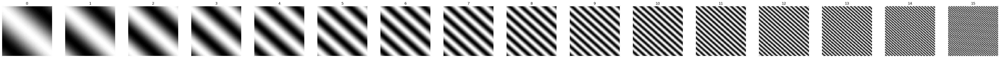

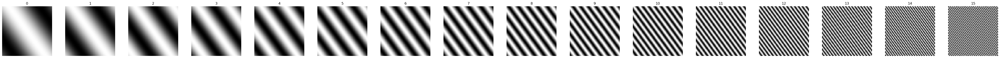

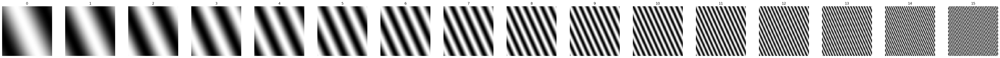

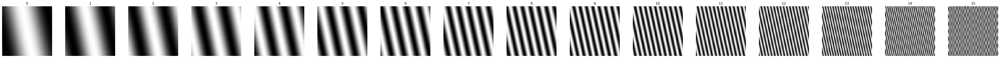

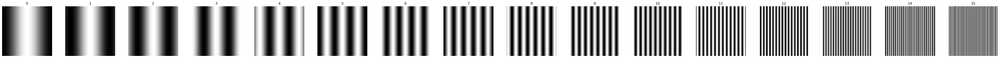

In [601]:
for theta_deg in sin_ims.keys(): 
    show_im_set(sin_ims[theta_deg], n_columns=16)

In [52]:
phis_w_o = []
sig = 50
for i in range(len(frequencies)) :
    inp = torch.stack([sin_ims[theta_deg][i] for theta_deg in orientations ] )    
    noise = torch.randn_like(inp )
    noisy_inp_ims = inp + noise * sig/255    
    phis_w_o.append(get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                                  average_phi=False,with_params=False , return_activations=False)[3].cpu().squeeze() )
phis_w_o = torch.stack(phis_w_o)
phis_w_o.shape

torch.Size([16, 16, 512])

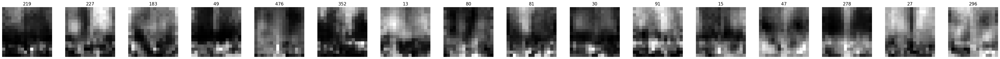

In [844]:

high_means_imiagenet = [219, 227, 183,  49, 476, 352,  13,  80,
         81,  30,  91,  15,  47, 278,  27, 296]

show_im_set(phis_w_o.permute(2, 0,1).unsqueeze(1)[ high_means_imiagenet ], n_columns=16, sub_labels=high_means_imiagenet)

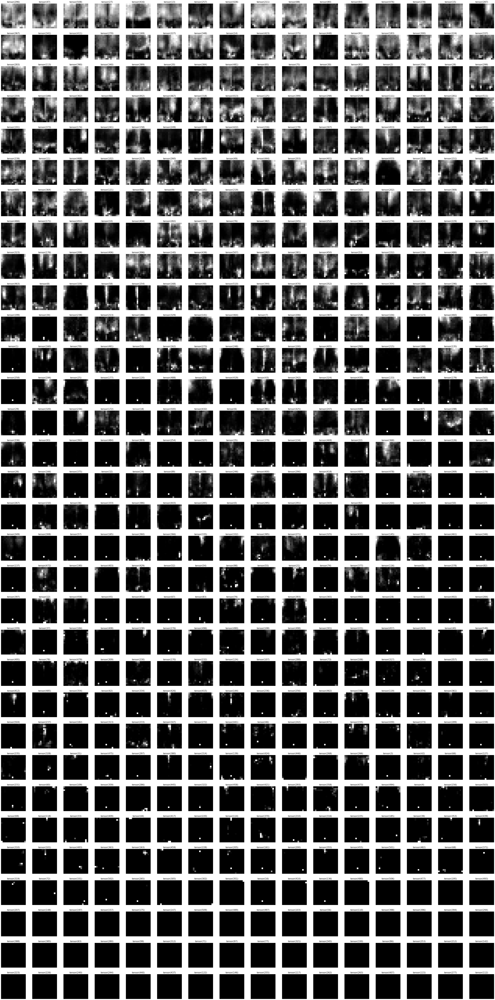

In [832]:
ids = phis_w_o.permute(2, 0,1).norm(dim = (1,2)).sort(descending=True)[1]
show_im_set(phis_w_o.permute(2, 0,1).unsqueeze(1)[ids], n_columns=16, sub_labels= ids)

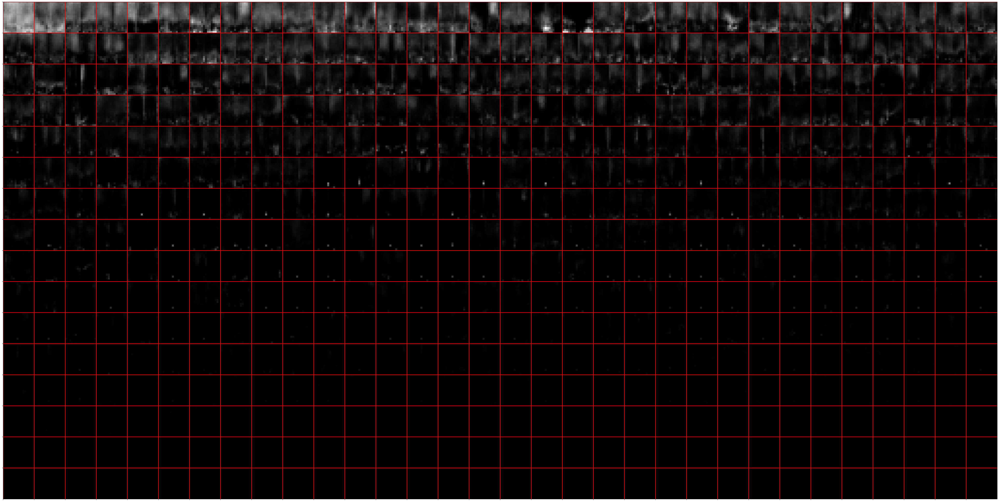

In [55]:
ids = phis_w_o.permute(2, 0,1).norm(dim = (1,2)).sort(descending=True)[1]

show_im_grid(phis_w_o.permute(2, 0,1).unsqueeze(1)[ids], n_columns=32, grid_lines=True)

Text(0.5, 0, 'channels - sorted')

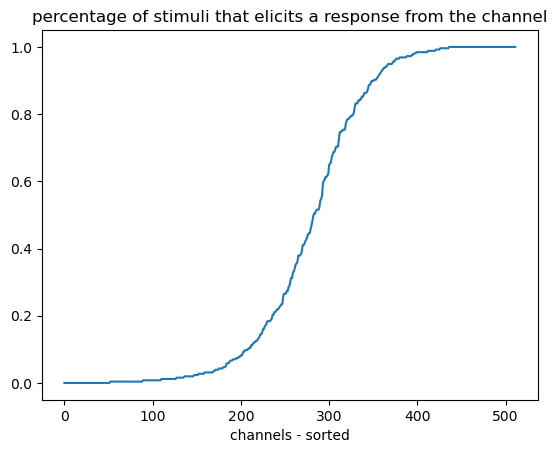

In [604]:
total_res_per_channel = torch.stack([(phis_w_o[:,:,c] > 0).sum()/(len(orientations) * len(frequencies)) for c in range(512)] )
plt.plot(total_res_per_channel.sort()[0])
plt.title('percentage of stimuli that elicits a response from the channel');
plt.xlabel('channels - sorted')

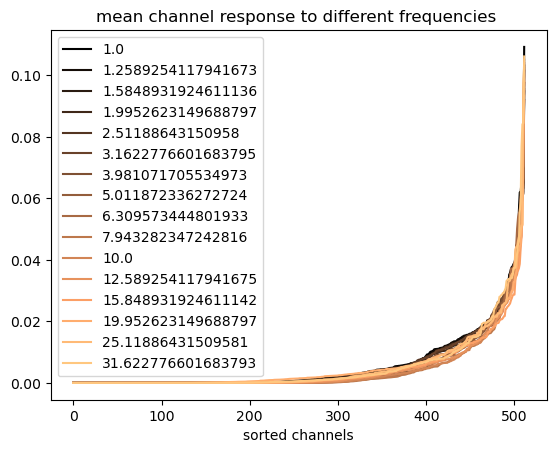

In [605]:
colormap = plt.cm.copper 
plot_colors = [colormap(i) for i in np.linspace(0, 1,len(phis_w_o))]


for i in range(len(frequencies)):
    plt.plot(phis_w_o[i].mean(dim = 0).sort()[0], color=plot_colors[i], label = frequencies[i])    

plt.legend()
plt.title('mean channel response to different frequencies ');
plt.xlabel('sorted channels');

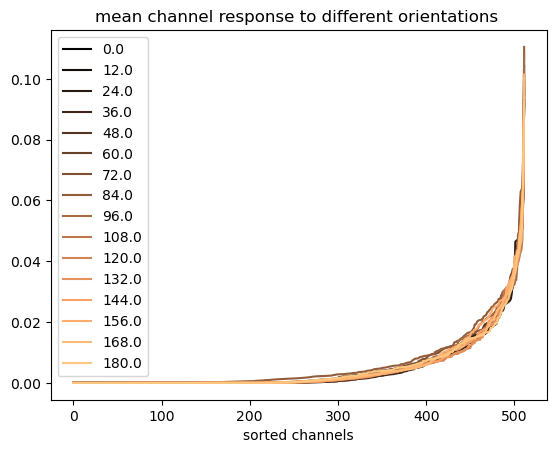

In [606]:
colormap = plt.cm.copper 
plot_colors = [colormap(i) for i in np.linspace(0, 1,len(phis_w_o))]


for i in range(len(orientations)):
    plt.plot(phis_w_o[:,i].mean(dim = 0).sort()[0], color=plot_colors[i], label = orientations[i])    

plt.legend()
plt.title('mean channel response to different orientations ');
plt.xlabel('sorted channels');

In [607]:
def participation_ratio(v): 
    return (v.norm(1)**2)/v.norm(2)**2/len(v)

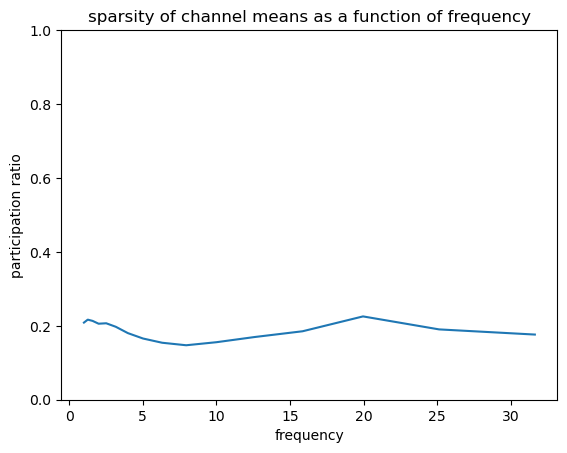

In [825]:
pr_k = []
for i in range(len(phi_k)):     
    pr_k.append(participation_ratio(phis_w_o[i].mean(dim = 0)))
plt.plot(frequencies, pr_k)
plt.ylim(0,1)
plt.ylabel('participation ratio')
plt.xlabel('frequency')
plt.title('sparsity of channel means as a function of frequency');

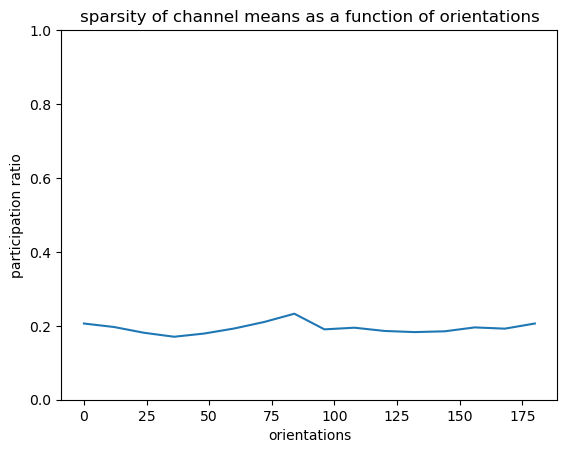

In [609]:
pr_k = []
for i in range(len(orientations)):     
    pr_k.append(participation_ratio(phis_w_o[:,i].mean(dim = 0)))
plt.plot(orientations, pr_k)
plt.ylim(0,1)
plt.ylabel('participation ratio')
plt.xlabel('orientations')
plt.title('sparsity of channel means as a function of orientations');

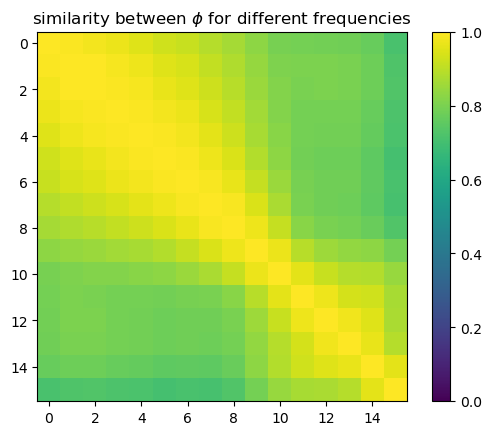

In [685]:
all_phi_k = torch.stack([phis_w_o[i].mean(dim =0 ) for i in range(len(frequencies))])
all_phi_k_normalized = all_phi_k/all_phi_k.norm(dim = 1, keepdim=True)
plt.imshow(all_phi_k_normalized @ all_phi_k_normalized.T, vmin=0, vmax = 1)
plt.colorbar()
(all_phi_k_normalized @ all_phi_k_normalized.T).min()
plt.title('similarity between $\phi$ for different frequencies');

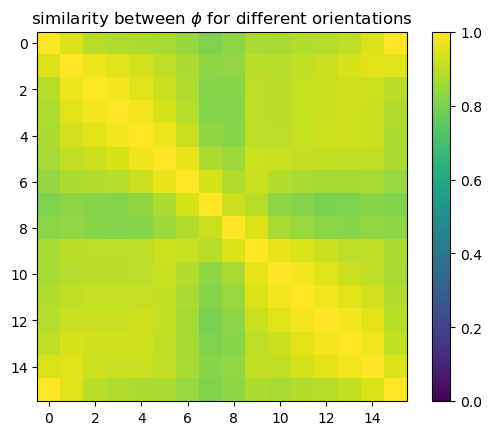

In [686]:
all_phi_o = torch.stack([phis_w_o[:,i].mean(dim =0 ) for i in range(len(orientations))])

all_phi_o_normalized = all_phi_o/all_phi_o.norm(dim = 1, keepdim=True)
plt.imshow(all_phi_o_normalized @ all_phi_o_normalized.T, vmin=0, vmax = 1)
plt.colorbar()
(all_phi_o_normalized @ all_phi_o_normalized.T).min()
plt.title(r'similarity between $\phi$ for different orientations');

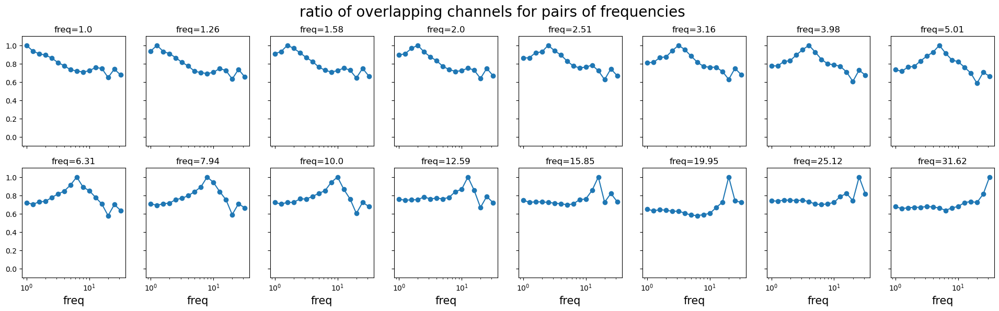

In [785]:
all_phi_k = torch.stack([phis_w_o[i].mean(dim =0 ) for i in range(len(frequencies))])

f, axs = plt.subplots(2,8, figsize = (24,6), sharex=True, sharey=True)
axs = axs.ravel()
f.suptitle('ratio of overlapping channels for pairs of frequencies', fontsize = 20);

for f1 in range(len(frequencies)):
    overlap_channels = []
    for f2 in range(len(frequencies)):
        set1 = set(torch.where(all_phi_k[f1]>.001)[0].numpy())
        set2 = set(torch.where(all_phi_k[f2]>.001)[0].numpy())
        overlap_channels.append(1- len( set1^ set2) /len(set1 | set2 ))
    axs[f1].plot(frequencies, overlap_channels, '-o')
    axs[f1].set_ylim(-0.1,1.1)
    axs[f1].set_title( f'freq={round(frequencies[f1],2)}' )
    axs[f1].set_xscale('log')
for f1 in range(8, 16):
    axs[f1].set_xlabel('freq',  fontsize = 15 )
        

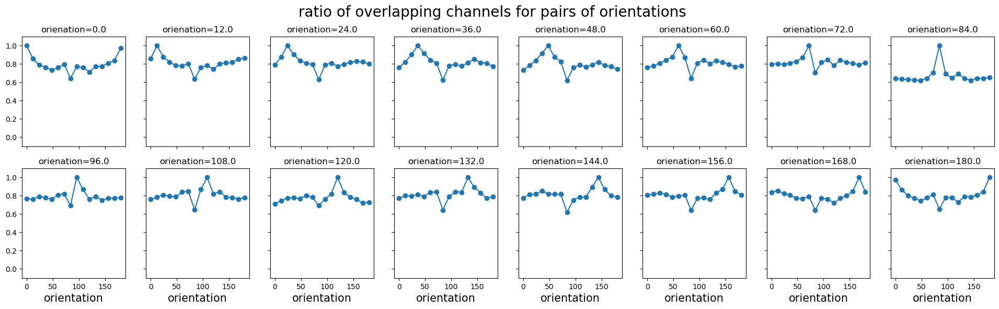

In [784]:
all_phi_o = torch.stack([phis_w_o[:,i].mean(dim =0 ) for i in range(len(orientations))])

f, axs = plt.subplots(2,8, figsize = (24,6), sharex=True, sharey=True)
axs = axs.ravel()
f.suptitle('ratio of overlapping channels for pairs of orientations', fontsize = 20);
for o1 in range(len(orientations)):
    overlap_channels = []
    for o2 in range(len(orientations)):
        set1 = set(torch.where(all_phi_o[o1]>.001)[0].numpy())
        set2 = set(torch.where(all_phi_o[o2]>.001)[0].numpy())
        overlap_channels.append(1- len( set1^ set2) /len(set1 | set2 ))
        
    axs[o1].plot(orientations, overlap_channels, '-o')
    axs[o1].set_ylim(-0.1,1.1)
    axs[o1].set_title( f'orienation={round(orientations[o1],2)}')
for o1 in range(8, 16):
    axs[o1].set_xlabel('orientation',  fontsize = 15 )

## Gaussian noise response

In [851]:
phis_d_c = []
noisy_inp_ims = torch.randn(10,3,64,64) + .5
phis_d_c.append(get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                                  average_phi=False,with_params=False , return_activations=False)[3].cpu().squeeze() )

phis_d_c = torch.vstack(phis_d_c)
phis_d_c.shape

torch.Size([10, 512])

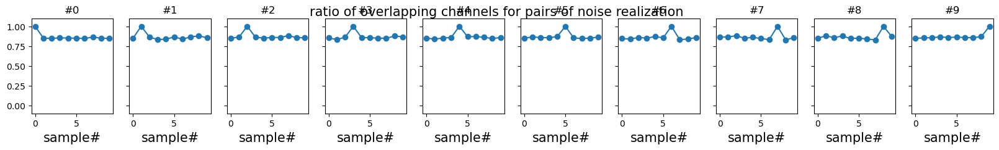

In [852]:
f, axs = plt.subplots(1,10, figsize = (20,2), sharex=True, sharey=True)
# axs = axs.ravel()
# plt.tight_layout()

f.suptitle('ratio of overlapping channels for pairs of noise realization', fontsize = 15);
for r1 in range(10 ):
    overlap_channels = []
    for r2 in range(10 ):
        set1 = set(torch.where(phis_d_c[r1]>0.001)[0].numpy())
        set2 = set(torch.where(phis_d_c[r2]>0.001)[0].numpy())
        overlap_channels.append(1- len( set1^ set2) /len(set1 | set2 ))
        
    axs[r1].plot(range(10),overlap_channels, '-o')
    axs[r1].set_ylim(-0.1,1.1)
    axs[r1].set_title( f'#{r1}')
    axs[r1].set_xlabel('sample#',  fontsize = 15 )

# Dirac

<StemContainer object of 3 artists>

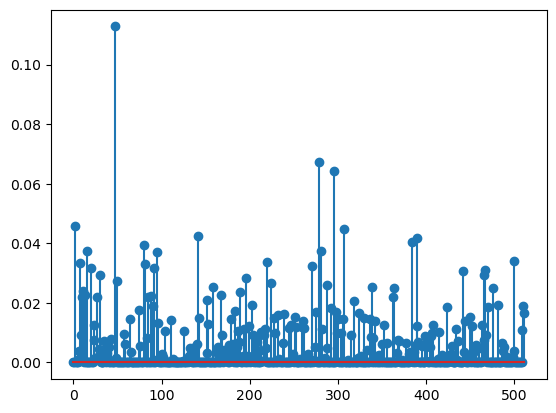

In [658]:
inp_im = torch.zeros(1,3,64,64)
inp_im[:,:, 32,32] = 1
noise = torch.randn(1,3,64,64)* 50/255 
noisy_inp_ims = noise + inp_im 

phis_d_c = get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                                  average_phi=False,with_params=False , return_activations=False)[3].cpu().squeeze() 

plt.stem(phis_d_c)

<StemContainer object of 3 artists>

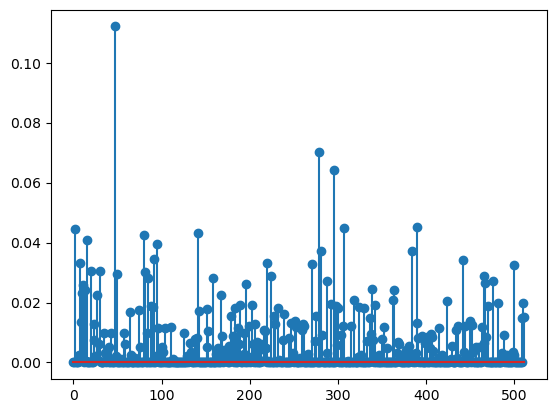

In [657]:
inp_im = torch.zeros(1,3,64,64)
inp_im[:,:, 16,16] = 1
noisy_inp_ims = noise + inp_im 

phis_d_c = get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                                  average_phi=False,with_params=False , return_activations=False)[3].cpu().squeeze() 

plt.stem(phis_d_c)

## Sparsity and texture sensitivity

In [6]:
def sign(M):
    M[M>=.5 ] = 1
    M[M<.5] = 0
    return M

In [7]:
edge_ims = {}
frequencies = np.logspace(0, 1.5, 16 )
orientations = np.linspace(0, 180, 16)
for theta_deg in orientations: 
    edge_ims[theta_deg] = []
    for k in frequencies :     
        edge_ims[theta_deg].append(sign(make_sine_wave(im_shape = (64,64), k=k, theta_deg= theta_deg, shift=0, color=None)))
    edge_ims[theta_deg] = torch.cat(edge_ims[theta_deg])    


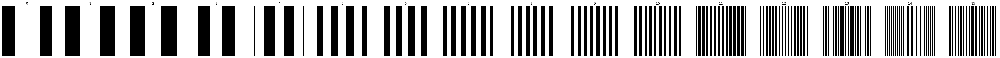

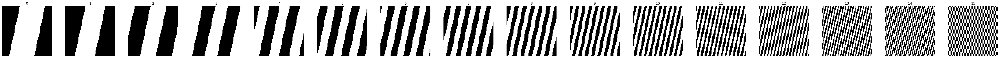

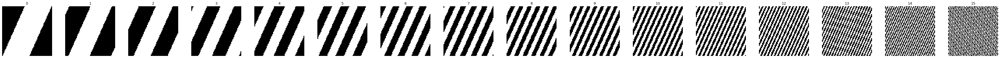

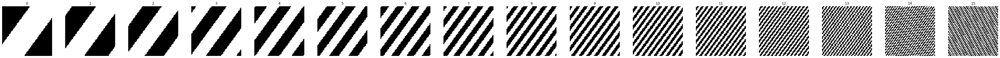

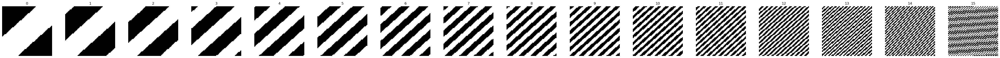

...

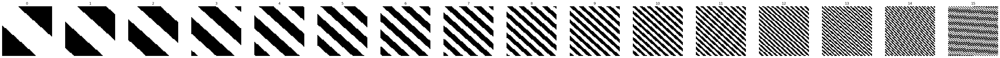

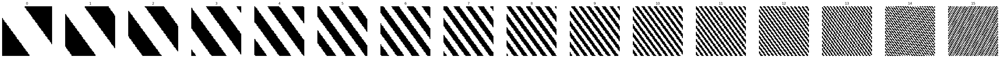

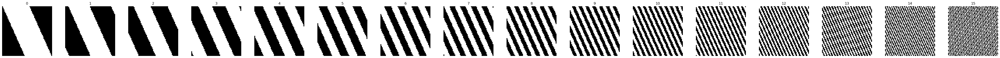

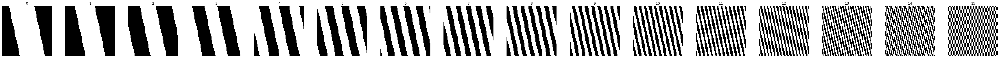

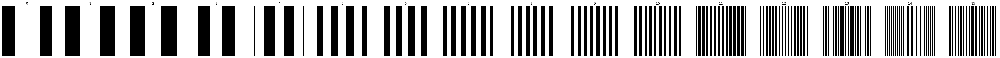

In [665]:
for theta_deg in sin_ims.keys(): 
    show_im_set(edge_ims[theta_deg], n_columns=16)

In [41]:
acts_e = []
sig = 50
for i in range(len(frequencies)) :
    inp = torch.stack([edge_ims[theta_deg][i] for theta_deg in orientations ] )    
    noise = torch.randn_like(inp )
    noisy_inp_ims = inp + noise * sig/255    
    acts_e.append(get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                                  average_phi=False,with_params=False , return_activations=True)[1][3].cpu().squeeze() )
acts_e = torch.stack(acts_e)
acts_e.shape

torch.Size([16, 16, 512, 8, 8])

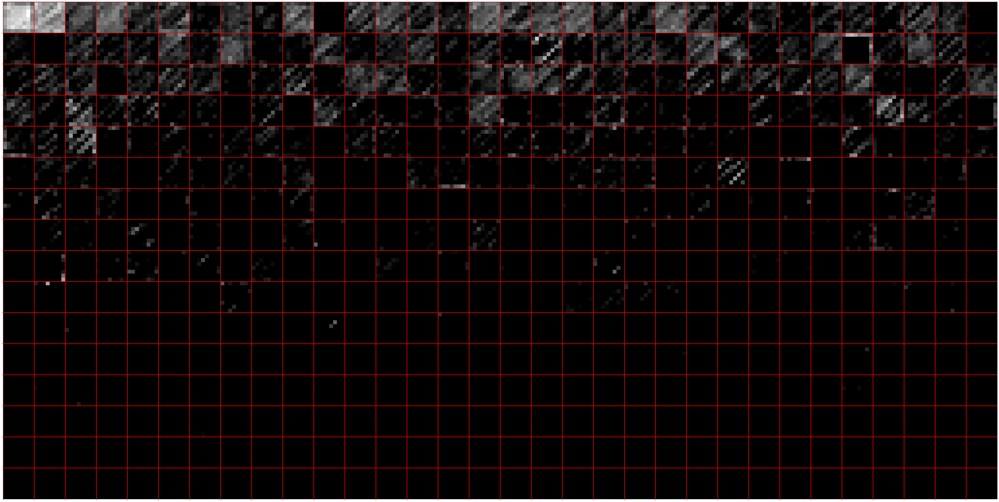

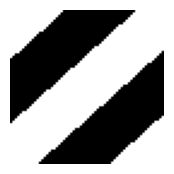

In [44]:
ids2 = phis_e.permute(2, 0,1).norm(dim = (1,2)).sort(descending=True)[1]

freq = 2
orient =  4
show_im_grid(acts_e[freq,orient ].unsqueeze(1).cpu()[ids2], n_columns=32, grid_lines=True )
plot_single_im(edge_ims[orientations[orient]][freq])

In [21]:
phis_e = []
sig = 50
for i in range(len(frequencies)) :
    inp = torch.stack([edge_ims[theta_deg][i] for theta_deg in orientations ] )    
    noise = torch.randn_like(inp )
    noisy_inp_ims = inp + noise * sig/255    
    phis_e.append(get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                                  average_phi=False,with_params=False , return_activations=False)[3].cpu().squeeze() )
phis_e = torch.stack(phis_e)
phis_e.shape

torch.Size([16, 16, 512])

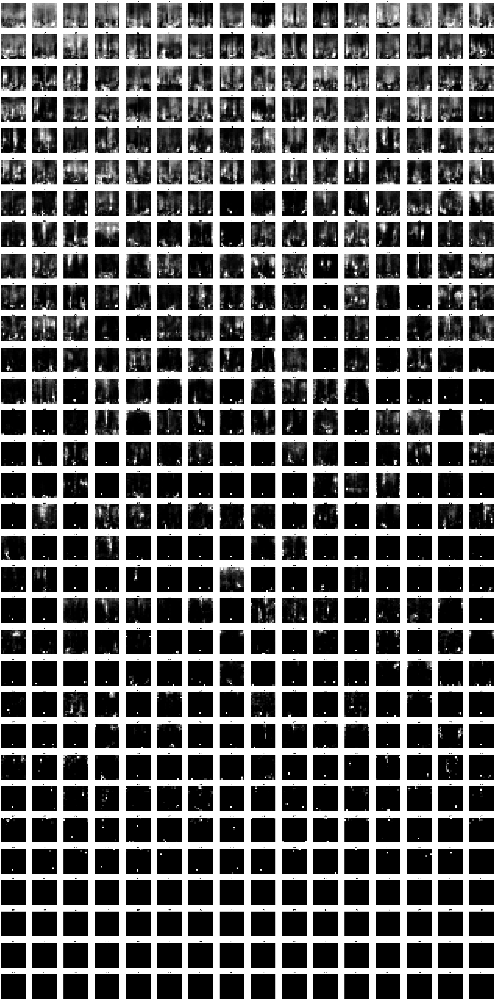

In [45]:
ids2 = phis_e.permute(2, 0,1).norm(dim = (1,2)).sort(descending=True)[1]
show_im_set(phis_e.permute(2, 0,1).unsqueeze(1)[ids2], n_columns=16)

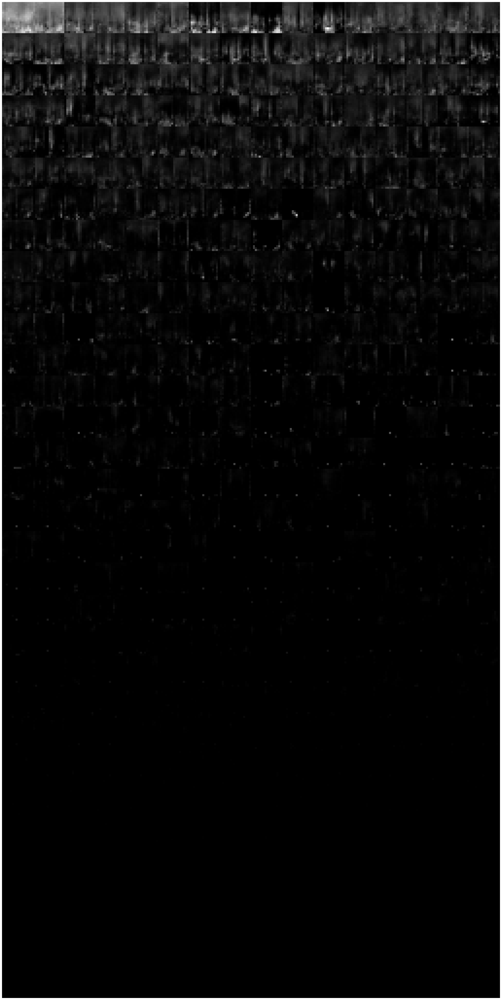

In [853]:
ids2 = phis_e.permute(2, 0,1).norm(dim = (1,2)).sort(descending=True)[1]
show_im_grid(phis_e.permute(2, 0,1).unsqueeze(1)[ids2], n_columns=16)

Text(0.5, 0, 'channels - sorted')

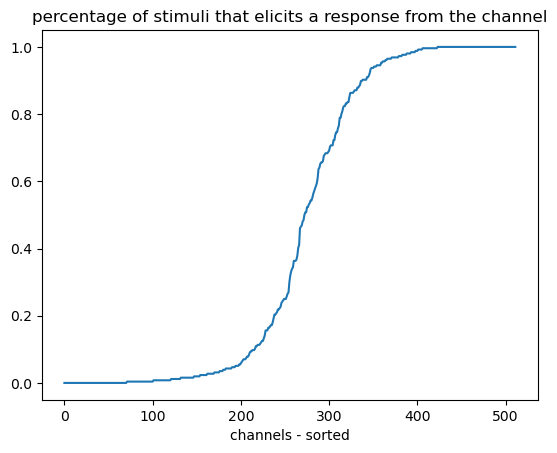

In [669]:
total_res_per_channel = torch.stack([(phis_e[:,:,c] > 0).sum()/(len(orientations) * len(frequencies)) for c in range(512)] )
plt.plot(total_res_per_channel.sort()[0])
plt.title('percentage of stimuli that elicits a response from the channel');
plt.xlabel('channels - sorted')

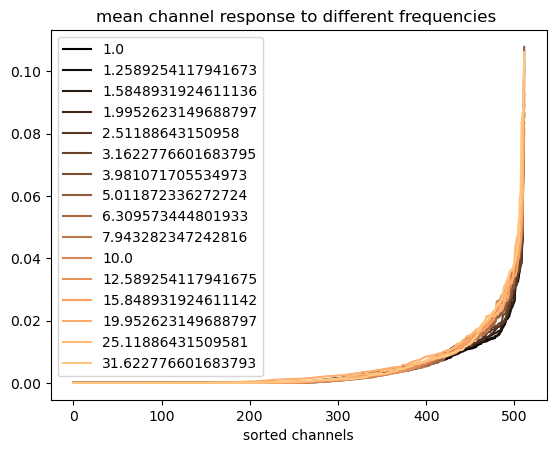

In [670]:
colormap = plt.cm.copper 
plot_colors = [colormap(i) for i in np.linspace(0, 1,len(phis_e))]


for i in range(len(frequencies)):
    plt.plot(phis_e[i].mean(dim = 0).sort()[0], color=plot_colors[i], label = frequencies[i])    

plt.legend()
plt.title('mean channel response to different frequencies ');
plt.xlabel('sorted channels');

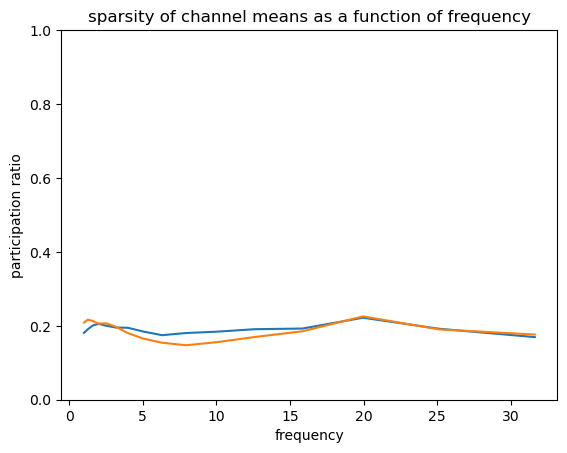

In [826]:
pr_k = []
for i in range(len(phi_k)):     
    pr_k.append(participation_ratio(phis_e[i].mean(dim = 0)))
plt.plot(frequencies, pr_k)
plt.ylim(0,1)
plt.ylabel('participation ratio')
plt.xlabel('frequency')
plt.title('sparsity of channel means as a function of frequency');

pr_k = []
for i in range(len(phi_k)):     
    pr_k.append(participation_ratio(phis_w_o[i].mean(dim = 0)))
plt.plot(frequencies, pr_k)
plt.ylim(0,1)
plt.ylabel('participation ratio')
plt.xlabel('frequency')
plt.title('sparsity of channel means as a function of frequency');

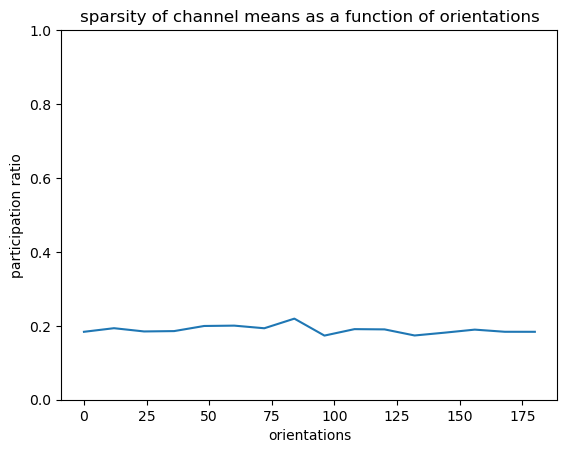

In [673]:
pr_k = []
for i in range(len(orientations)):     
    pr_k.append(participation_ratio(phis_e[:,i].mean(dim = 0)))
plt.plot(orientations, pr_k)
plt.ylim(0,1)
plt.ylabel('participation ratio')
plt.xlabel('orientations')
plt.title('sparsity of channel means as a function of orientations');

In [ ]:
all_phi_k1 = torch.stack([phis_e[i].mean(dim =0 ) for i in range(len(frequencies))])
all_phi_k_normalized = all_phi_k/all_phi_k.norm(dim = 1, keepdim=True)
plt.imshow(all_phi_k_normalized @ all_phi_k_normalized.T, vmin=0, vmax = 1)
plt.colorbar()
(all_phi_k_normalized @ all_phi_k_normalized.T).min()
plt.title('similarity between $\phi$ for different frequencies');

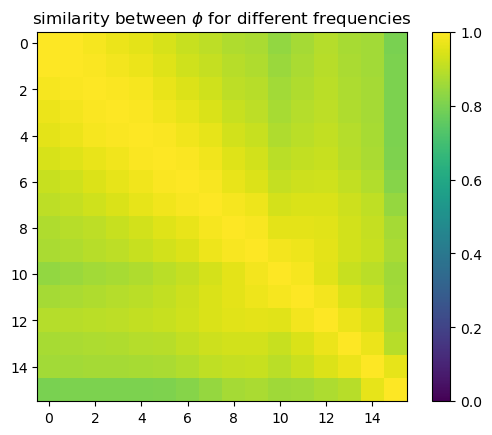

In [675]:
all_phi_k = torch.stack([phis_e[i].mean(dim =0 ) for i in range(len(frequencies))])
all_phi_k_normalized = all_phi_k/all_phi_k.norm(dim = 1, keepdim=True)
plt.imshow(all_phi_k_normalized @ all_phi_k_normalized.T, vmin=0, vmax = 1)
plt.colorbar()
(all_phi_k_normalized @ all_phi_k_normalized.T).min()
plt.title('similarity between $\phi$ for different frequencies');

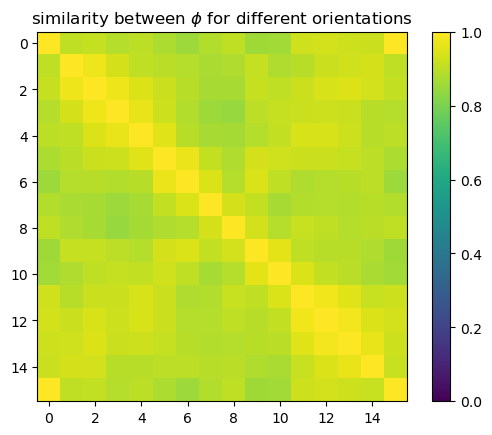

In [676]:
all_phi_o = torch.stack([phis_e[:,i].mean(dim =0 ) for i in range(len(orientations))])

all_phi_o_normalized = all_phi_o/all_phi_o.norm(dim = 1, keepdim=True)
plt.imshow(all_phi_o_normalized @ all_phi_o_normalized.T, vmin=0, vmax = 1)
plt.colorbar()
(all_phi_o_normalized @ all_phi_o_normalized.T).min()
plt.title(r'similarity between $\phi$ for different orientations');

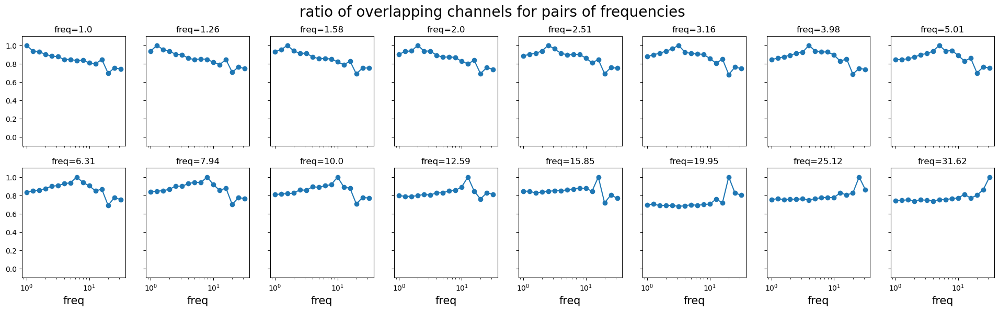

In [684]:
f, axs = plt.subplots(2,8, figsize = (24,6), sharex=True, sharey=True)
axs = axs.ravel()
f.suptitle('ratio of overlapping channels for pairs of frequencies', fontsize = 20);

for f1 in range(len(frequencies)):
    overlap_channels = []
    for f2 in range(len(frequencies)):
        set1 = set(torch.where(all_phi_k[f1]>0)[0].numpy())
        set2 = set(torch.where(all_phi_k[f2]>0)[0].numpy())
        overlap_channels.append(1- len( set1^ set2) /len(set1 | set2 ))
    axs[f1].plot(frequencies, overlap_channels, '-o')
    axs[f1].set_ylim(-0.1,1.1)
    axs[f1].set_title( f'freq={round(frequencies[f1],2)}' )
    axs[f1].set_xscale('log')
for f1 in range(8, 16):
    axs[f1].set_xlabel('freq',  fontsize = 15 )

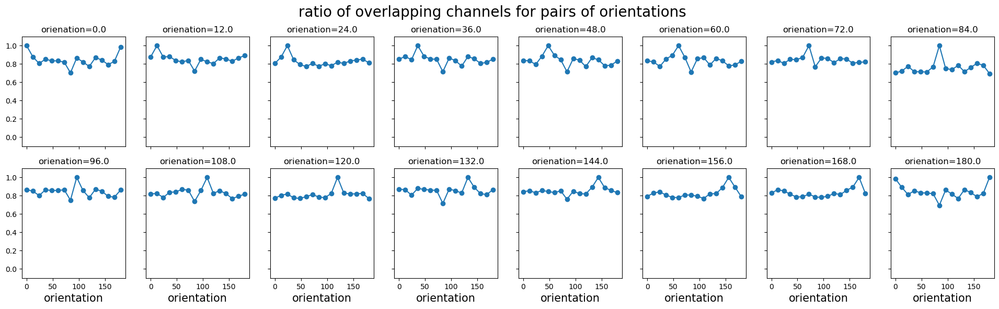

In [683]:
f, axs = plt.subplots(2,8, figsize = (24,6), sharex=True, sharey=True)
axs = axs.ravel()
f.suptitle('ratio of overlapping channels for pairs of orientations', fontsize = 20);
for o1 in range(len(orientations)):
    overlap_channels = []
    for o2 in range(len(orientations)):
        set1 = set(torch.where(all_phi_o[o1]>0)[0].numpy())
        set2 = set(torch.where(all_phi_o[o2]>0)[0].numpy())
        overlap_channels.append(1- len( set1^ set2) /len(set1 | set2 ))
        
    axs[o1].plot(orientations, overlap_channels, '-o')
    axs[o1].set_ylim(-0.1,1.1)
    axs[o1].set_title( f'orienation={round(orientations[o1],2)}')
for o1 in range(8, 16):
    axs[o1].set_xlabel('orientation',  fontsize = 15 )

#### texture 



In [48]:
text_ims = {}
frequencies = np.logspace(0, 1.5, 16 )
orientations = np.linspace(0, 180, 16)
for theta_deg in orientations: 
    text_ims[theta_deg] = []
    for k in frequencies :     
        x = sign(make_sine_wave(im_shape = (64,64), k=k, theta_deg= theta_deg, shift=0, color=None)) 
        z = torch.tile(torch.randn(1,64,64), (3,1,1))
        t_w = torch.fft.ifft2( z* torch.fft.fft2(x))
        text_ims[theta_deg].append(t_w.abs() )
    text_ims[theta_deg] = torch.cat(text_ims[theta_deg] )    


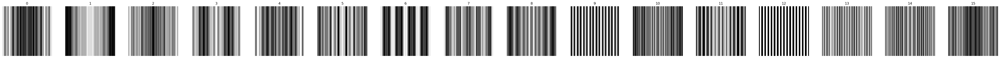

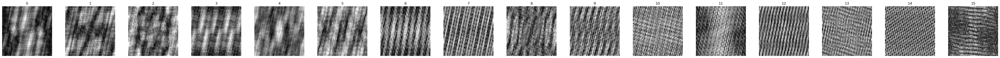

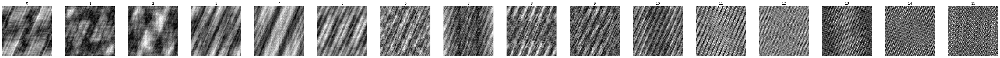

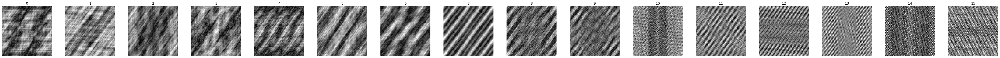

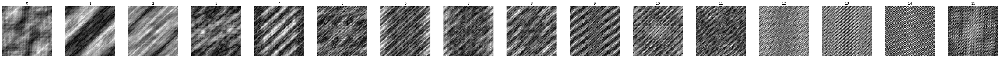

...

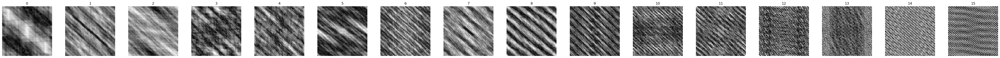

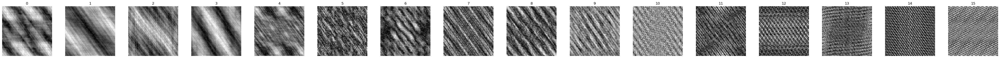

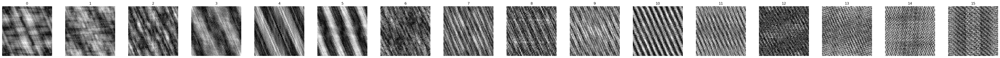

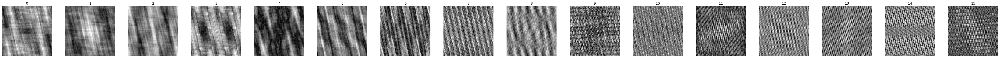

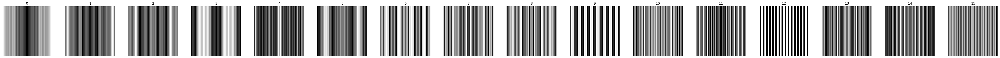

In [738]:
for theta_deg in sin_ims.keys(): 
    show_im_set(text_ims[theta_deg], n_columns=16)

In [49]:
phis_text = []
sig = 50
for i in range(len(frequencies)) :
    inp = torch.stack([text_ims[theta_deg][i] for theta_deg in orientations ] )   
    noise = torch.randn_like(inp )
    noisy_inp_ims = inp + noise * sig/255    
    phis_text.append(get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                                  average_phi=False,with_params=False , return_activations=False)[3].cpu().squeeze() )
phis_text = torch.stack(phis_text)
phis_text.shape

torch.Size([16, 16, 512])

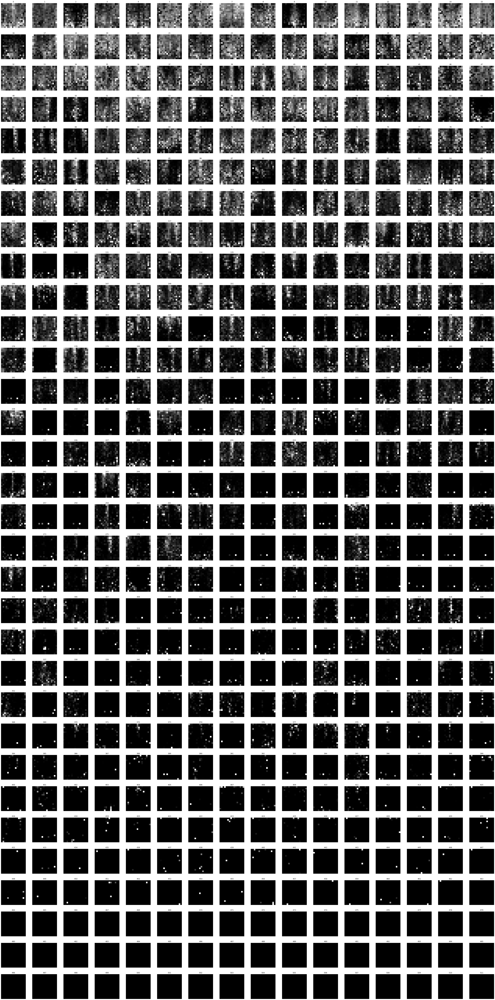

In [50]:
ids3 = phis_text.permute(2, 0,1).norm(dim = (1,2)).sort(descending=True)[1]
show_im_set(phis_text.permute(2, 0,1).unsqueeze(1)[ids3], n_columns=16)

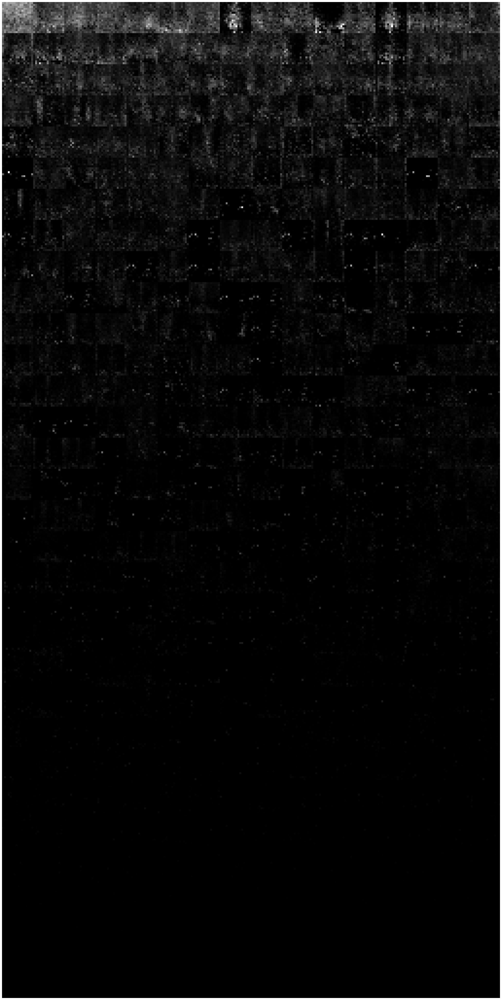

In [854]:
ids3 = phis_text.permute(2, 0,1).norm(dim = (1,2)).sort(descending=True)[1]

show_im_grid(phis_text.permute(2, 0,1).unsqueeze(1)[ids3], n_columns=16)

Text(0.5, 0, 'channels - sorted')

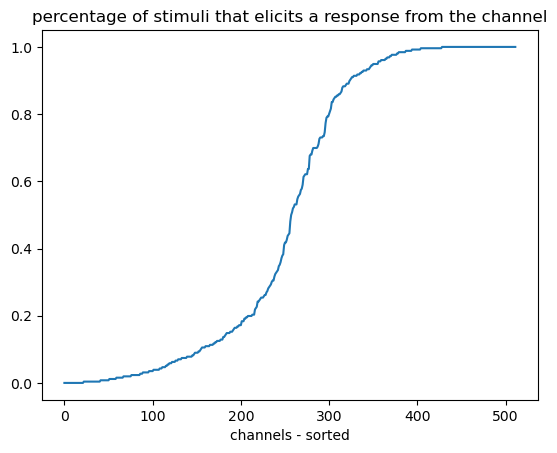

In [726]:
total_res_per_channel = torch.stack([(phis_text[:,:,c] > 0).sum()/(len(orientations) * len(frequencies)) for c in range(512)] )
plt.plot(total_res_per_channel.sort()[0])
plt.title('percentage of stimuli that elicits a response from the channel');
plt.xlabel('channels - sorted')

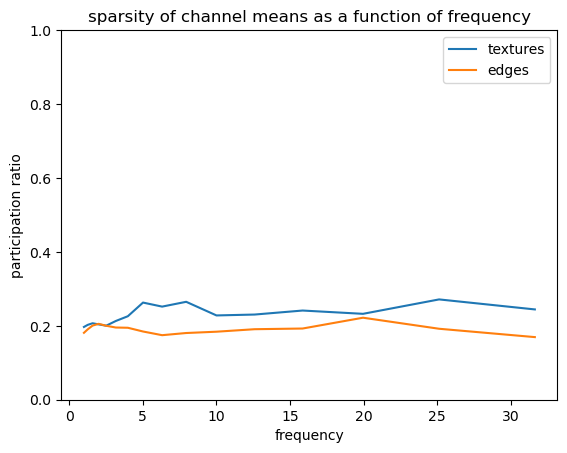

In [793]:
pr_k = []
for i in range(len(phi_k)):     
    pr_k.append(participation_ratio(phis_text[i].mean(dim = 0)))
plt.plot(frequencies, pr_k, label = 'textures')
pr_k = []
for i in range(len(phi_k)):     
    pr_k.append(participation_ratio(phis_e[i].mean(dim = 0)))
plt.plot(frequencies, pr_k, label = 'edges')
plt.ylim(0,1)
plt.ylabel('participation ratio')
plt.xlabel('frequency')
plt.title('sparsity of channel means as a function of frequency');
plt.legend()
# plt.ylim(0,1)
# plt.ylabel('participation ratio')
# plt.xlabel('frequency')
# plt.title('sparsity of channel means as a function of frequency');

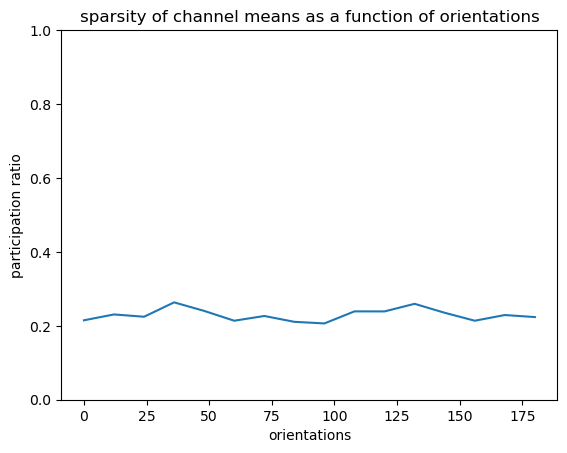

In [729]:
pr_k = []
for i in range(len(orientations)):     
    pr_k.append(participation_ratio(phis_text[:,i].mean(dim = 0)))
plt.plot(orientations, pr_k)
plt.ylim(0,1)
plt.ylabel('participation ratio')
plt.xlabel('orientations')
plt.title('sparsity of channel means as a function of orientations');

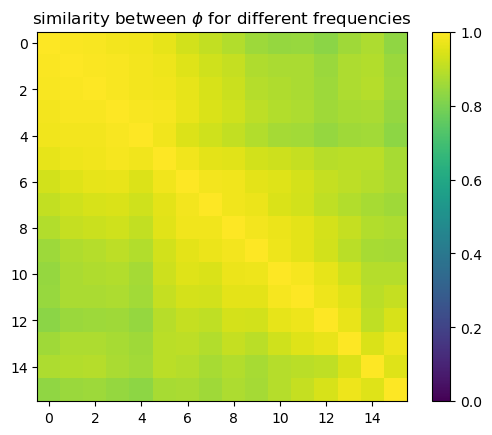

In [730]:
all_phi_k = torch.stack([phis_text[i].mean(dim =0 ) for i in range(len(frequencies))])
all_phi_k_normalized = all_phi_k/all_phi_k.norm(dim = 1, keepdim=True)
plt.imshow(all_phi_k_normalized @ all_phi_k_normalized.T, vmin=0, vmax = 1)
plt.colorbar()
(all_phi_k_normalized @ all_phi_k_normalized.T).min()
plt.title('similarity between $\phi$ for different frequencies');

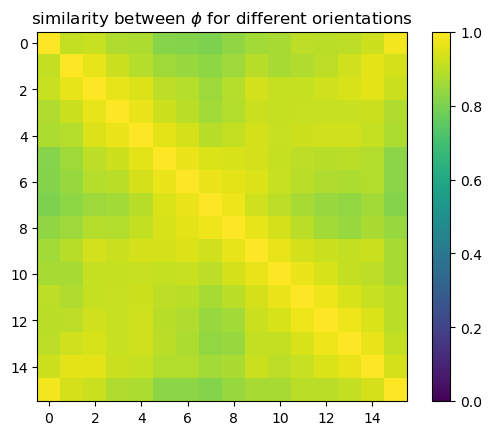

In [731]:
all_phi_o = torch.stack([phis_text[:,i].mean(dim =0 ) for i in range(len(orientations))])

all_phi_o_normalized = all_phi_o/all_phi_o.norm(dim = 1, keepdim=True)
plt.imshow(all_phi_o_normalized @ all_phi_o_normalized.T, vmin=0, vmax = 1)
plt.colorbar()
(all_phi_o_normalized @ all_phi_o_normalized.T).min()
plt.title(r'similarity between $\phi$ for different orientations');

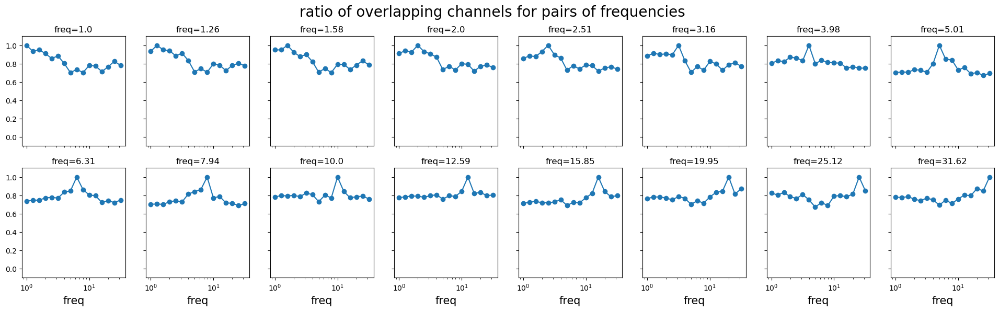

In [765]:
all_phi_k = torch.stack([phis_text[i].mean(dim =0 ) for i in range(len(frequencies))])

f, axs = plt.subplots(2,8, figsize = (24,6), sharex=True, sharey=True)
axs = axs.ravel()
f.suptitle('ratio of overlapping channels for pairs of frequencies', fontsize = 20);

for f1 in range(len(frequencies)):
    overlap_channels = []
    for f2 in range(len(frequencies)):
        set1 = set(torch.where(all_phi_k[f1]>0.001)[0].numpy())
        set2 = set(torch.where(all_phi_k[f2]>0.001)[0].numpy())
        overlap_channels.append(1- len( set1^ set2) /len(set1 | set2 ))
    axs[f1].plot(frequencies, overlap_channels, '-o')
    axs[f1].set_ylim(-0.1,1.1)
    axs[f1].set_title( f'freq={round(frequencies[f1],2)}' )
    axs[f1].set_xscale('log')
for f1 in range(8, 16):
    axs[f1].set_xlabel('freq',  fontsize = 15 )

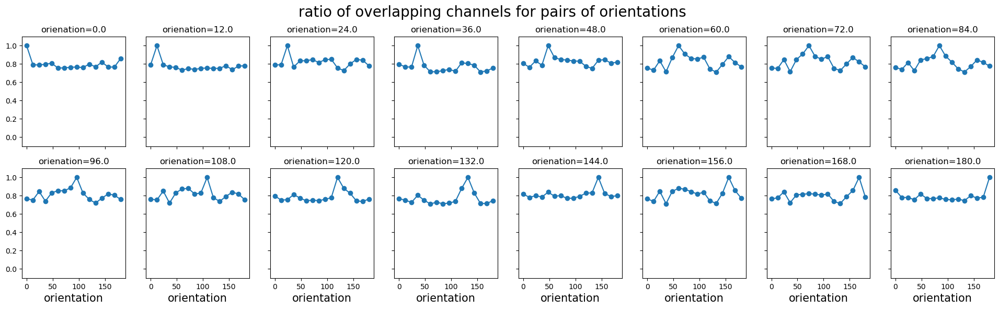

In [764]:
all_phi_o = torch.stack([phis_text[:,i].mean(dim =0 ) for i in range(len(orientations))])

f, axs = plt.subplots(2,8, figsize = (24,6), sharex=True, sharey=True)
axs = axs.ravel()
f.suptitle('ratio of overlapping channels for pairs of orientations', fontsize = 20);
for o1 in range(len(orientations)):
    overlap_channels = []
    for o2 in range(len(orientations)):
        set1 = set(torch.where(all_phi_o[o1]>0.001)[0].numpy())
        set2 = set(torch.where(all_phi_o[o2]>0.001)[0].numpy())
        overlap_channels.append(1- len( set1^ set2) /len(set1 | set2 ))
        
    axs[o1].plot(orientations, overlap_channels, '-o')
    axs[o1].set_ylim(-0.1,1.1)
    axs[o1].set_title( f'orienation={round(orientations[o1],2)}')
for o1 in range(8, 16):
    axs[o1].set_xlabel('orientation',  fontsize = 15 )

## color 

In [743]:
sin_color_ims = []
for _ in range(16): 
        sin_color_ims.append(make_sine_wave(im_shape = (64,64), k=1, theta_deg= 0, shift=0, color=np.random.rand(3) ))
sin_color_ims = torch.cat(sin_color_ims)    



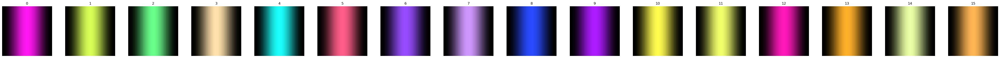

In [744]:
show_im_set(sin_color_ims, n_columns=16)

In [754]:
phis_color = []
sig = 50
noise = torch.tile(torch.randn(1,3,64,64) , (16,1,1,1))
noisy_inp_ims = sin_color_ims + noise * sig/255    
phis_color.append(get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                              average_phi=False,with_params=False , return_activations=False)[3].cpu().squeeze() )
phis_color = torch.vstack(phis_color)
phis_color.shape

torch.Size([16, 512])

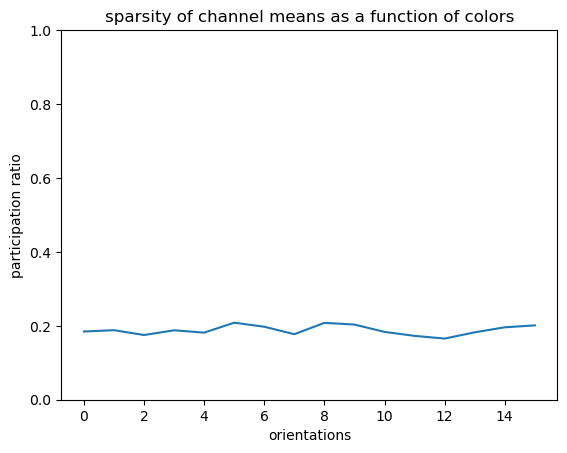

In [795]:
pr_k = []
for i in range(16 ):     
    pr_k.append(participation_ratio(phis_color[i] ))
plt.plot( pr_k)
plt.ylim(0,1)
plt.ylabel('participation ratio')
plt.xlabel('orientations')
plt.title('sparsity of channel means as a function of colors');

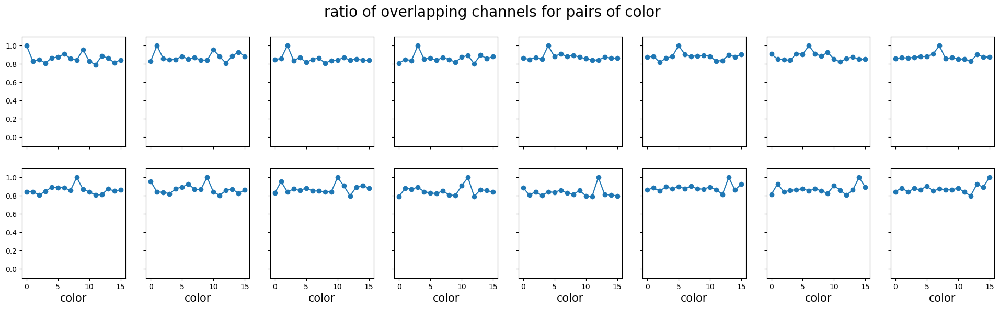

In [763]:

f, axs = plt.subplots(2,8, figsize = (24,6), sharex=True, sharey=True)
axs = axs.ravel()
f.suptitle('ratio of overlapping channels for pairs of color', fontsize = 20);
for i1 in range(16):
    overlap_channels = []
    for i2 in range(16):
        set1 = set(torch.where(phis_color[i1]>0.001)[0].numpy())
        set2 = set(torch.where(phis_color[i2]>0.001)[0].numpy())
        overlap_channels.append(1- len( set1^ set2) /len(set1 | set2 ))
        
    axs[i1].plot(range(16), overlap_channels, '-o')
    axs[i1].set_ylim(-0.1,1.1)
    # axs[i1].set_title( f'orienation={round(orientations[i1],2)}')
for i1 in range(8, 16):
    axs[i1].set_xlabel('color',  fontsize = 15 )

## Invariance/covariance

In [799]:

sin_ims_scale = []
for s in np.linspace(.1,1,16) : 
        sin_ims_scale.append(s* make_sine_wave(im_shape = (64,64), k=2, theta_deg= 0, shift=0, color=None ))
sin_ims_scale = torch.cat(sin_ims_scale)    



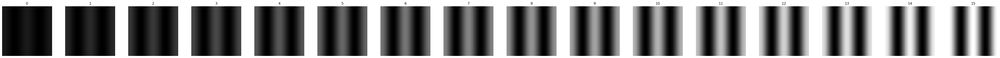

In [780]:
show_im_set(sin_ims_scale[:,0:1], n_columns=16, vmin=0, vmax = 1)

In [804]:
phis_scale = []
noise = torch.randn(1,3,64,64) 
for j,sig in zip(range(16),np.linspace(.1,1,16)): 
    noisy_inp_ims = sin_ims_scale[j] + noise * sig    
    phis_scale.append(get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                              average_phi=False,with_params=False , return_activations=False)[3].cpu().squeeze() )
phis_scale = torch.stack(phis_scale)
phis_scale.shape

torch.Size([16, 512])

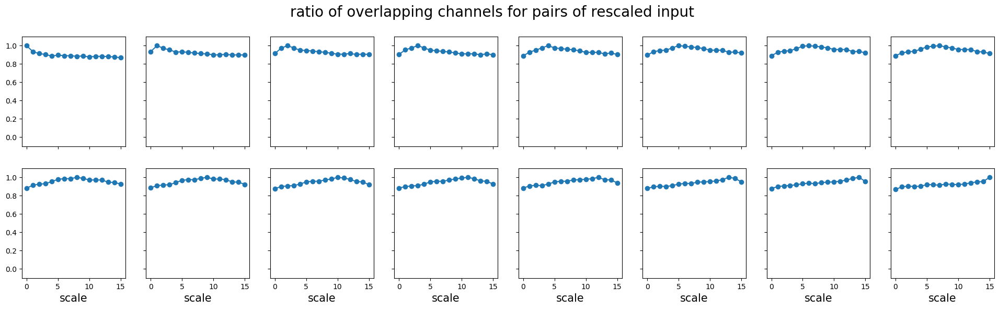

In [816]:

f, axs = plt.subplots(2,8, figsize = (24,6), sharex=True, sharey=True)
axs = axs.ravel()
f.suptitle('ratio of overlapping channels for pairs of rescaled input', fontsize = 20);
for i1 in range(16):
    overlap_channels = []
    for i2 in range(16):
        set1 = set(torch.where(phis_scale[i1]>0)[0].numpy())
        set2 = set(torch.where(phis_scale[i2]>0)[0].numpy())
        overlap_channels.append(1- len( set1^ set2) /len(set1 | set2 ))
        
    axs[i1].plot(range(16), overlap_channels, '-o')
    axs[i1].set_ylim(-0.1,1.1)
    # axs[i1].set_title( f'orienation={round(orientations[i1],2)}')
for i1 in range(8, 16):
    axs[i1].set_xlabel('scale',  fontsize = 15 )

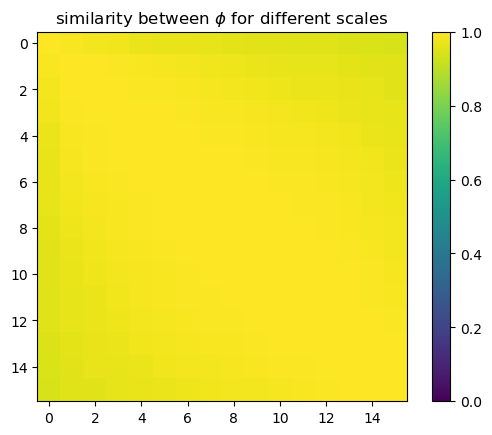

In [807]:

phis_scale_normalized = phis_scale/phis_scale.norm(dim = 1, keepdim=True)
plt.imshow(phis_scale_normalized @ phis_scale_normalized.T, vmin=0, vmax = 1)
plt.colorbar()
(phis_scale_normalized @ phis_scale_normalized.T).min()
plt.title(r'similarity between $\phi$ for different scales');

In [811]:
np.random.uniform(0, 2*np.pi)

3.7204142285697377

In [820]:

sin_ims_shifted = []
for shift in np.linspace(0,2 * np.pi,16) : 
        sin_ims_shifted.append(make_sine_wave(im_shape = (64,64), k=1, theta_deg= 0, shift=shift, color=None ))
sin_ims_shifted = torch.cat(sin_ims_shifted)    



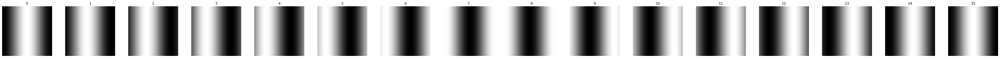

In [821]:
show_im_set(sin_ims_shifted[:,0:1], n_columns=16, vmin=0, vmax = 1)

In [822]:
phis_shift = []
noise = torch.randn(1,3,64,64) 
for j,sig in zip(range(16),np.linspace(.1,1,16)): 
    noisy_inp_ims = sin_ims_shifted[j] + noise * sig    
    phis_shift.append(get_channel_means(denoisers[group], x1=noisy_inp_ims, x2=None,
                              average_phi=False,with_params=False , return_activations=False)[3].cpu().squeeze() )
phis_shift = torch.stack(phis_shift)
phis_shift.shape

torch.Size([16, 512])

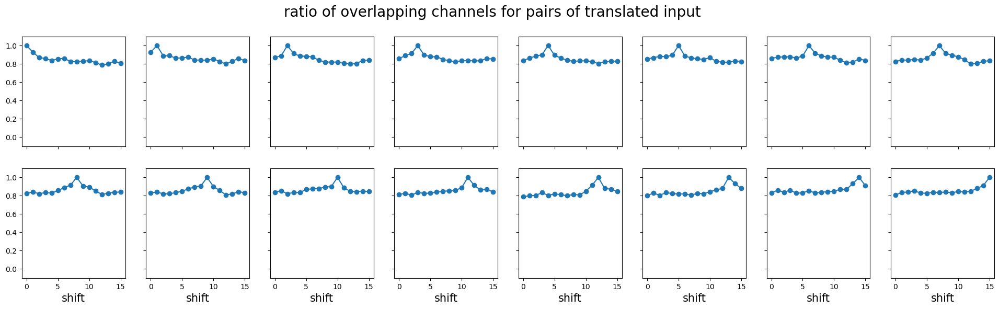

In [823]:

f, axs = plt.subplots(2,8, figsize = (24,6), sharex=True, sharey=True)
axs = axs.ravel()
f.suptitle('ratio of overlapping channels for pairs of translated input', fontsize = 20);
for i1 in range(16):
    overlap_channels = []
    for i2 in range(16):
        set1 = set(torch.where(phis_shift[i1]>0 )[0].numpy())
        set2 = set(torch.where(phis_shift[i2]>0)[0].numpy())
        overlap_channels.append(1- len( set1^ set2) /len(set1 | set2 ))
        
    axs[i1].plot(range(16), overlap_channels, '-o')
    axs[i1].set_ylim(-0.1,1.1)
    # axs[i1].set_title( f'orienation={round(orientations[i1],2)}')
for i1 in range(8, 16):
    axs[i1].set_xlabel('shift',  fontsize = 15 )

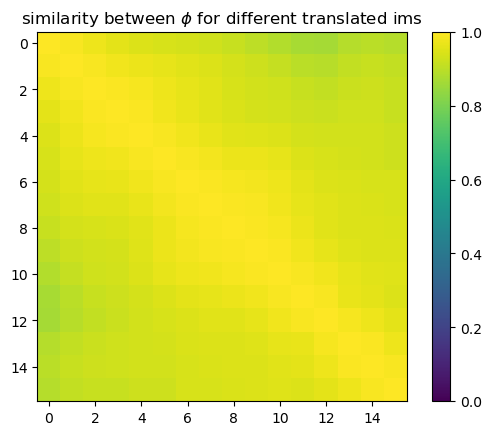

In [824]:
phis_shift_normalized = phis_shift/phis_shift.norm(dim = 1, keepdim=True)
plt.imshow(phis_shift_normalized @ phis_shift_normalized.T, vmin=0, vmax = 1)
plt.colorbar()
(phis_shift_normalized @ phis_shift_normalized.T).min()
plt.title(r'similarity between $\phi$ for different translated ims');